<a href="https://colab.research.google.com/github/iEnisCiceklitas/trafficLightsYolov5model/blob/main/clothesDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt
%pip install -q roboflow
import torch
import os
from IPython.display import Image, clear_output

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")



Cloning into 'yolov5'...
remote: Enumerating objects: 16471, done.
remote: Counting objects: 100% (63/63), done.
remote: Compressing objects: 100% (56/56), done.
remote: Total 16471 (delta 9), reused 48 (delta 7), pack-reused 16408
Receiving objects: 100% (16471/16471), 15.16 MiB | 27.23 MiB/s, done.
Resolving deltas: 100% (11272/11272), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.4/195.4 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 716.0/716.0 kB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.2/70.2 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 20.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 16.2 MB/s

In [3]:
from roboflow import Roboflow

os.environ["DATASET_DIRECTORY"] = "/content/datasets"
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="jUi3wXRnI0LZO74l3Kr2")
project = rf.workspace("cardetection-nymkr").project("clothes-h0p9v")
dataset = project.version(1).download("yolov5")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/datasets/clothes-1 in yolov5pytorch:: 100%|██████████| 1215/1215 [00:00<00:00, 7737.11it/s]


In [4]:
!python train.py --img 640 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache


2024-02-25 18:34:01.760562: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-25 18:34:01.760629: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-25 18:34:01.762008: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/datasets/clothes-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=Fa

In [5]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [20]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt --img 640 --conf 0.2 --source {dataset.location}/valid/images

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/datasets/clothes-1/valid/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-286-g41603da1 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/28 /content/datasets/clothes-1/valid/images/panthe-107-_jpg.rf.97f59712f138485e441cf88b1f799f93.jpg: 640x640 1 clothes, 11.5ms
image 2/28 /content/datasets/clothes-1/valid/images/panthe-111-_jpg.rf.623b640e267e1c6f6b396bee7a06e335.jpg: 640x640 1 clothes, 11.6ms
image 3/28 /content/dat

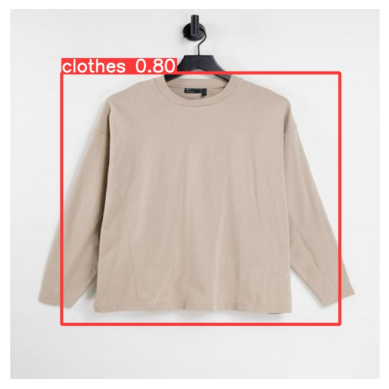

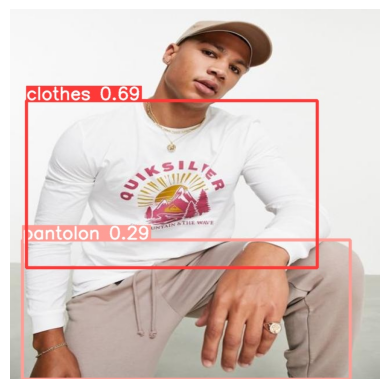

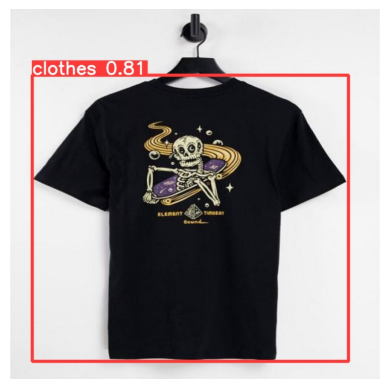

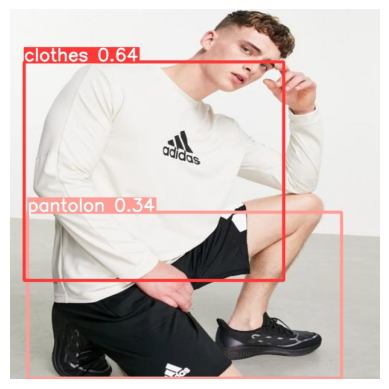

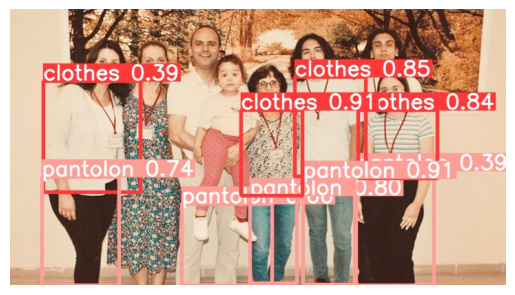

...

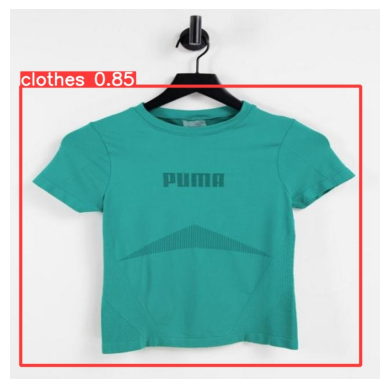

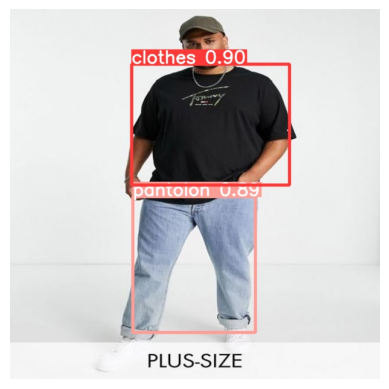

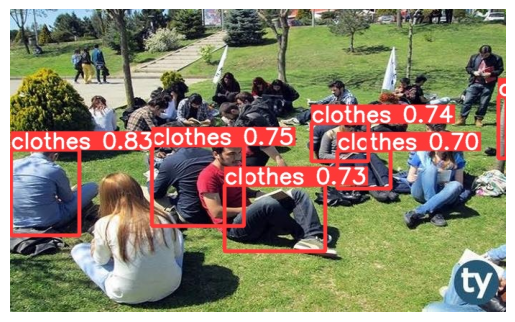

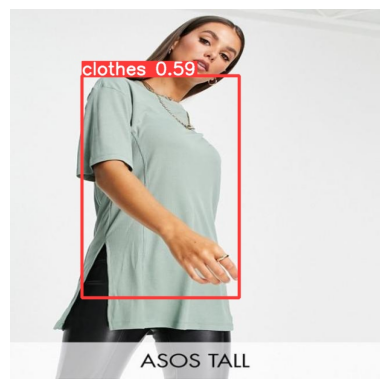

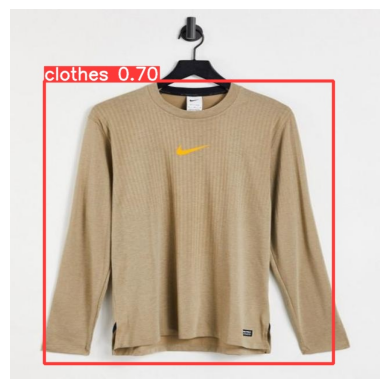

In [21]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

test_data_path = '/content/yolov5/runs/detect/exp8'
for filename in os.listdir(test_data_path):
    img = mpimg.imread(os.path.join(test_data_path, filename))
    plt.imshow(img)
    plt.axis('off')
    plt.show()